In [1]:
# The objective of this project is to segment customers into distinct and meaningful 
# groups based on their purchasing behavior, engagement patterns, and demographic 
# characteristics using unsupervised machine learning techniques.

# By identifying customer segments, the business can:
# Better understand customer behavior
# Design targeted marketing campaigns
# Improve customer retention and loyalty
# Optimize resource allocation and personalized offerings

In [2]:
import pandas as pd
df=pd.read_csv(r"C:\Users\Shashank\OneDrive\Desktop\marketing_campaign.csv")
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524.0,1957.0,Graduation,Single,58138.0,0.0,0.0,04-09-2012,58.0,635.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,1.0
1,2174.0,1954.0,Graduation,Single,46344.0,1.0,1.0,08-03-2014,38.0,11.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
2,4141.0,1965.0,Graduation,Together,71613.0,0.0,0.0,21-08-2013,26.0,426.0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
3,6182.0,1984.0,Graduation,Together,26646.0,1.0,0.0,10-02-2014,26.0,11.0,...,6.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
4,5324.0,1981.0,PhD,Married,58293.0,1.0,0.0,19-01-2014,94.0,173.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3236,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df.shape

(3240, 29)

In [4]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3240 entries, 0 to 3239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   float64
 1   Year_Birth           2240 non-null   float64
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   float64
 6   Teenhome             2240 non-null   float64
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   float64
 9   MntWines             2240 non-null   float64
 10  MntFruits            2240 non-null   float64
 11  MntMeatProducts      2240 non-null   float64
 12  MntFishProducts      2240 non-null   float64
 13  MntSweetProducts     2240 non-null   float64
 14  MntGoldProds         2240 non-null   float64
 15  NumDealsPurchases    2240 non-null   f

In [6]:
df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


## Handling NULL Values

In [7]:
df.isnull().sum()

ID                     1000
Year_Birth             1000
Education              1000
Marital_Status         1000
Income                 1024
Kidhome                1000
Teenhome               1000
Dt_Customer            1000
Recency                1000
MntWines               1000
MntFruits              1000
MntMeatProducts        1000
MntFishProducts        1000
MntSweetProducts       1000
MntGoldProds           1000
NumDealsPurchases      1000
NumWebPurchases        1000
NumCatalogPurchases    1000
NumStorePurchases      1000
NumWebVisitsMonth      1000
AcceptedCmp3           1000
AcceptedCmp4           1000
AcceptedCmp5           1000
AcceptedCmp1           1000
AcceptedCmp2           1000
Complain               1000
Z_CostContact          1000
Z_Revenue              1000
Response               1000
dtype: int64

In [8]:
df = df.apply(lambda x: x.fillna(x.median()) if x.dtype != 'object' else x.fillna(x.mode()[0]))


In [9]:
df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

## Handling Dulpicate Entries

In [10]:
df.duplicated().sum()

999

In [11]:
df=df.drop_duplicates()
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524.0,1957.0,Graduation,Single,58138.0,0.0,0.0,04-09-2012,58.0,635.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,1.0
1,2174.0,1954.0,Graduation,Single,46344.0,1.0,1.0,08-03-2014,38.0,11.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
2,4141.0,1965.0,Graduation,Together,71613.0,0.0,0.0,21-08-2013,26.0,426.0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
3,6182.0,1984.0,Graduation,Together,26646.0,1.0,0.0,10-02-2014,26.0,11.0,...,6.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
4,5324.0,1981.0,PhD,Married,58293.0,1.0,0.0,19-01-2014,94.0,173.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2236,4001.0,1946.0,PhD,Together,64014.0,2.0,1.0,10-06-2014,56.0,406.0,...,7.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,11.0,0.0
2237,7270.0,1981.0,Graduation,Divorced,56981.0,0.0,0.0,25-01-2014,91.0,908.0,...,6.0,0.0,1.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
2238,8235.0,1956.0,Master,Together,69245.0,0.0,1.0,24-01-2014,8.0,428.0,...,3.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0
2239,9405.0,1954.0,PhD,Married,52869.0,1.0,1.0,15-10-2012,40.0,84.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,1.0


In [12]:
df.duplicated().sum()

0

In [13]:
df.nunique().sum()

7212

## Correlation

In [14]:
z=df.corr(numeric_only=True)
z

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,1.000000,0.000026,0.012996,0.002420,-0.002562,-0.046524,-0.022870,0.004608,-0.004429,-0.024465,...,-0.007451,-0.036034,-0.025381,-0.007512,-0.021609,-0.015059,0.033885,NaN,NaN,-0.021959
Year_Birth,0.000026,1.000000,-0.160900,0.230103,-0.352084,-0.019871,-0.157784,-0.017937,-0.030891,-0.041644,...,0.121149,0.061761,-0.060521,0.007110,-0.005942,-0.006544,-0.030132,NaN,NaN,0.021306
Income,0.012996,-0.160900,1.000000,-0.425249,0.018976,-0.004061,0.576890,0.428777,0.577787,0.437550,...,-0.549779,-0.016059,0.182719,0.334891,0.274890,0.087582,-0.027185,NaN,NaN,0.132869
Kidhome,0.002420,0.230103,-0.425249,1.000000,-0.035778,0.008827,-0.496062,-0.372338,-0.436881,-0.387394,...,0.447667,0.014775,-0.161469,-0.205496,-0.172213,-0.081661,0.040236,NaN,NaN,-0.079838
Teenhome,-0.002562,-0.352084,0.018976,-0.035778,1.000000,0.016196,0.005006,-0.176530,-0.260914,-0.203944,...,0.134738,-0.042552,0.038996,-0.190893,-0.139952,-0.015553,0.003177,NaN,NaN,-0.154236
Recency,-0.046524,-0.019871,-0.004061,0.008827,0.016196,1.000000,0.016064,-0.004305,0.023056,0.001080,...,-0.021445,-0.032990,0.018826,0.000129,-0.019282,-0.001781,0.013231,NaN,NaN,-0.198428
MntWines,-0.022870,-0.157784,0.576890,-0.496062,0.005006,0.016064,1.000000,0.389685,0.562700,0.399801,...,-0.320685,0.062247,0.373316,0.472638,0.354161,0.205920,-0.038989,NaN,NaN,0.247309
MntFruits,0.004608,-0.017937,0.428777,-0.372338,-0.176530,-0.004305,0.389685,1.000000,0.543146,0.594842,...,-0.418414,0.014783,0.010210,0.215876,0.194790,-0.009749,-0.005146,NaN,NaN,0.125364
MntMeatProducts,-0.004429,-0.030891,0.577787,-0.436881,-0.260914,0.023056,0.562700,0.543146,1.000000,0.568442,...,-0.539492,0.018326,0.102962,0.373801,0.309794,0.043054,-0.023463,NaN,NaN,0.236398
MntFishProducts,-0.024465,-0.041644,0.437550,-0.387394,-0.203944,0.001080,0.399801,0.594842,0.568442,1.000000,...,-0.446032,0.000416,0.016901,0.199623,0.260800,0.002601,-0.020931,NaN,NaN,0.111408


<Axes: >

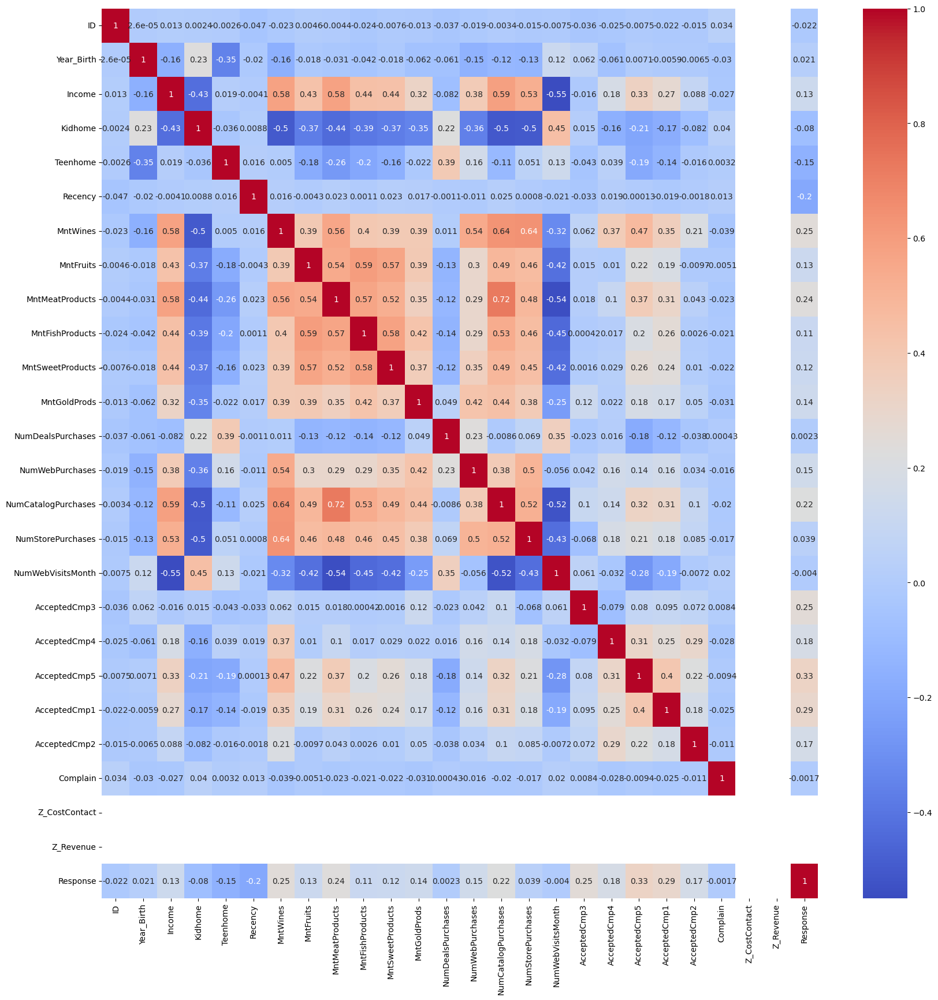

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize=(20,20))
sns.heatmap(z,annot=True,cmap='coolwarm')

## Data Vizulisation

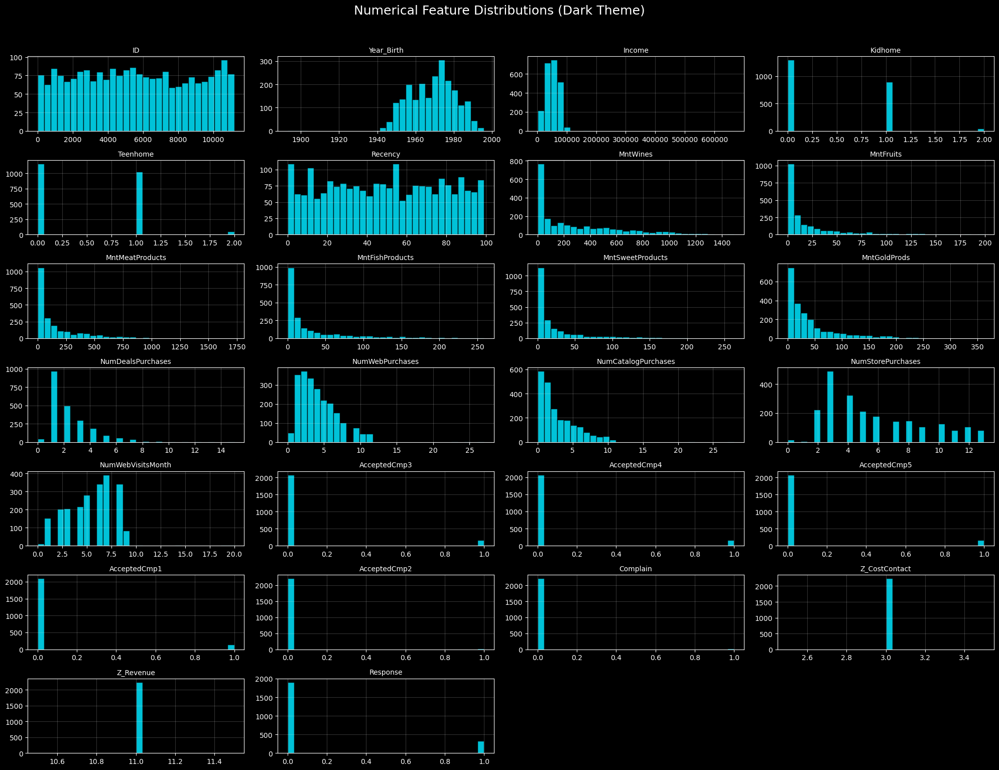

In [16]:
import matplotlib.pyplot as plt

# 1️⃣ Select numerical columns
num_cols = df.select_dtypes(include='number').columns

# 2️⃣ Dark theme
plt.style.use("dark_background")

# 3️⃣ Create subplots
fig, axes = plt.subplots(
    nrows=(len(num_cols)//4) + 1,
    ncols=4,
    figsize=(20, 15)
)

axes = axes.flatten()

# 4️⃣ Plot histograms
for i, col in enumerate(num_cols):
    axes[i].hist(df[col], bins=30, color='#00E5FF', edgecolor='black', alpha=0.85)
    axes[i].set_title(col, fontsize=10)
    axes[i].grid(alpha=0.2)

# 5️⃣ Remove empty plots
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Numerical Feature Distributions (Dark Theme)", fontsize=18, y=1.02)
plt.tight_layout()
plt.show()

# “The histogram grid shows that most numerical features are right-skewed, 
# indicating a small group of high-value customers and a large base of low-to-medium spenders
# Binary campaign features are highly imbalanced, showing low customer response rates. 
# Some features like Z_CostContact and Z_Revenue have zero variance and were removed. 
# Overall, the distribution patterns justify scaling, PCA, and KMeans clustering for customer segmentation.”


C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


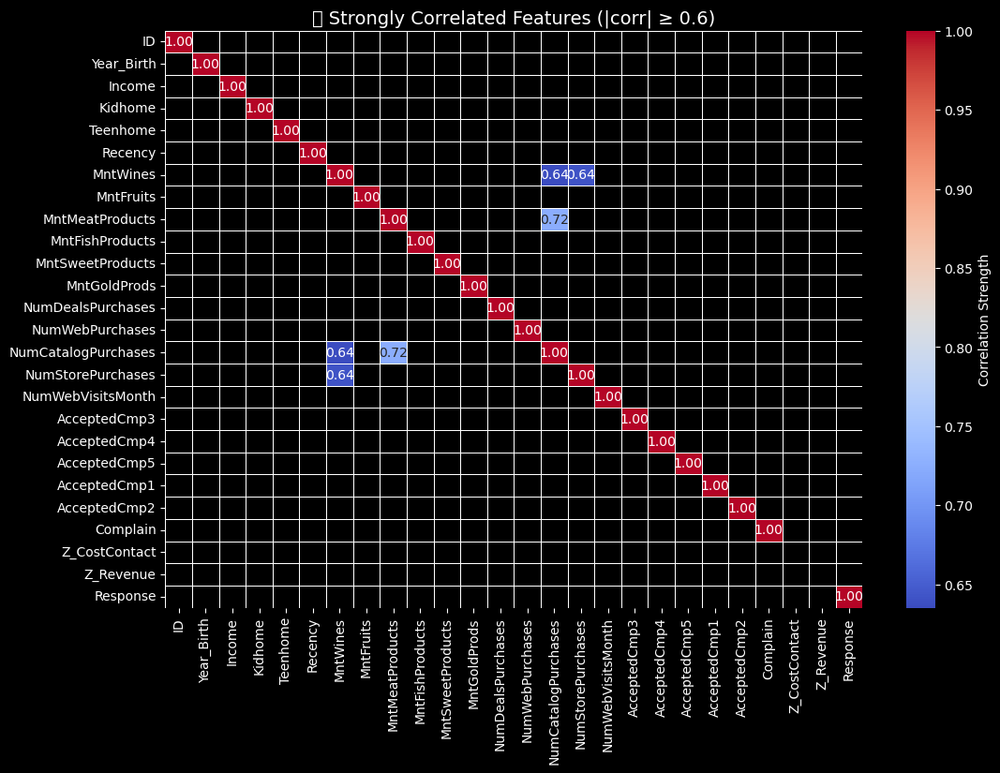

In [17]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

corr = df.select_dtypes(include='number').corr()

# Mask weak correlations
mask = np.abs(corr) < 0.6

plt.figure(figsize=(12,8))
sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={"label": "Correlation Strength"}
)

plt.title("🔥 Strongly Correlated Features (|corr| ≥ 0.6)", fontsize=14)
plt.show()


In [18]:
pair_features = [
    "Income",
    "Recency",
    "MntWines",
    "MntMeatProducts",
    "MntGoldProds",
    "NumWebPurchases",
    "NumStorePurchases",
    "NumWebVisitsMonth",
    "Response"
]


C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


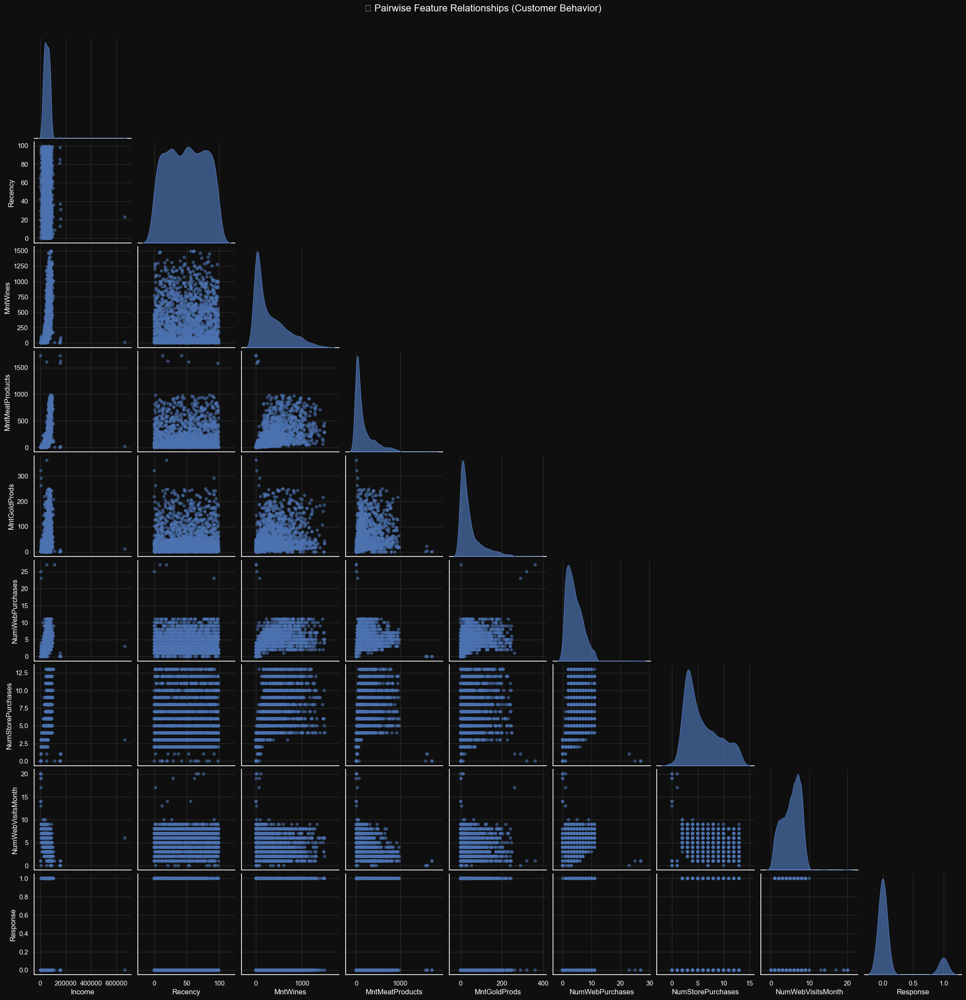

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_theme(
    style="darkgrid",
    rc={
        "axes.facecolor": "#0f0f0f",
        "figure.facecolor": "#0f0f0f",
        "grid.color": "#2a2a2a",
        "text.color": "white",
        "axes.labelcolor": "white",
        "xtick.color": "white",
        "ytick.color": "white"
    }
)

pair_df = df[pair_features]

sns.pairplot(
    pair_df,
    diag_kind="kde",          # smoother than hist
    corner=True,              # removes upper triangle (clean!)
    plot_kws={
        "alpha": 0.6,
        "s": 30,
        "edgecolor": "none"
    },
    diag_kws={
        "fill": True,
        "alpha": 0.7
    }
)

plt.suptitle(
    "🔥 Pairwise Feature Relationships (Customer Behavior)",
    fontsize=16,
    y=1.02
)

plt.show()

# The pairplot helped me identify skewed spending behavior, discrete purchase patterns, and natural customer groupings, 
# which guided my feature selection, scaling, PCA, and clustering approach.”

## Ploting For Categorical columns

In [20]:
cat_cols = df.select_dtypes(include=['object', 'category']).columns
cat_cols


Index(['Education', 'Marital_Status', 'Dt_Customer'], dtype='object')

C:\Users\Shashank\AppData\Local\Temp\ipykernel_10364\2840308434.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='Education', palette='viridis')


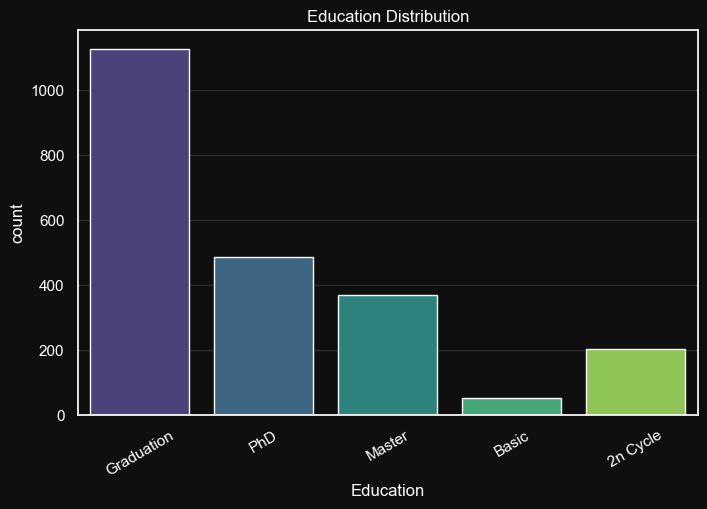

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.countplot(data=df, x='Education', palette='viridis')
plt.title("Education Distribution")
plt.xticks(rotation=30)
plt.show()


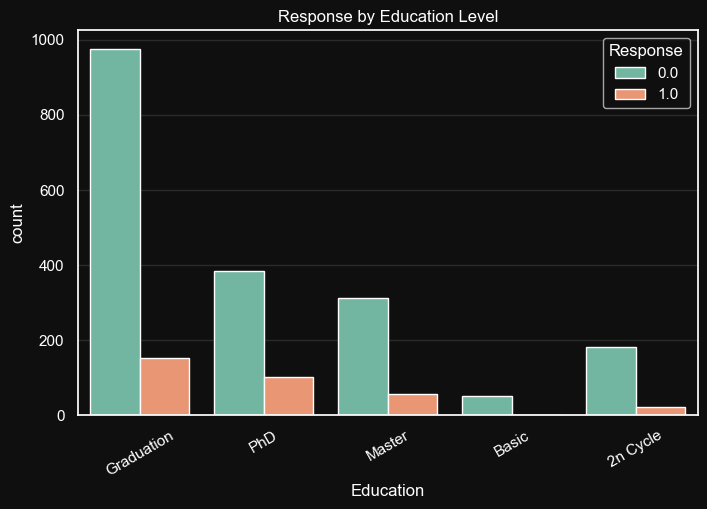

In [22]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='Education', hue='Response', palette='Set2')
plt.title("Response by Education Level")
plt.xticks(rotation=30)
plt.show()


C:\Users\Shashank\AppData\Local\Temp\ipykernel_10364\1919846509.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, y='Marital_Status', palette='coolwarm')


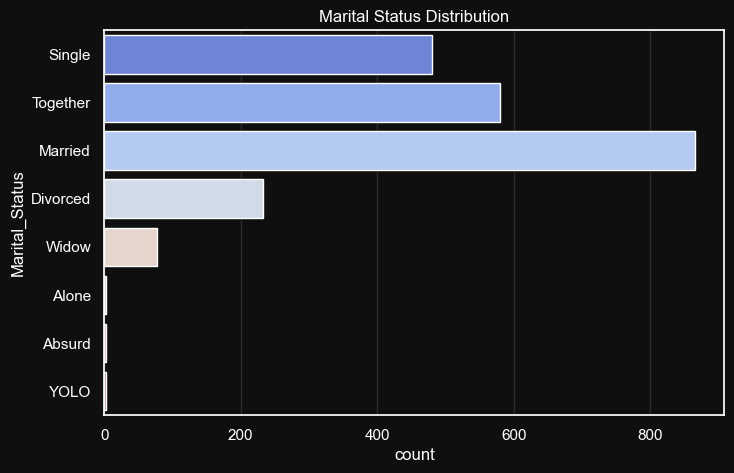

In [23]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, y='Marital_Status', palette='coolwarm')
plt.title("Marital Status Distribution")
plt.show()


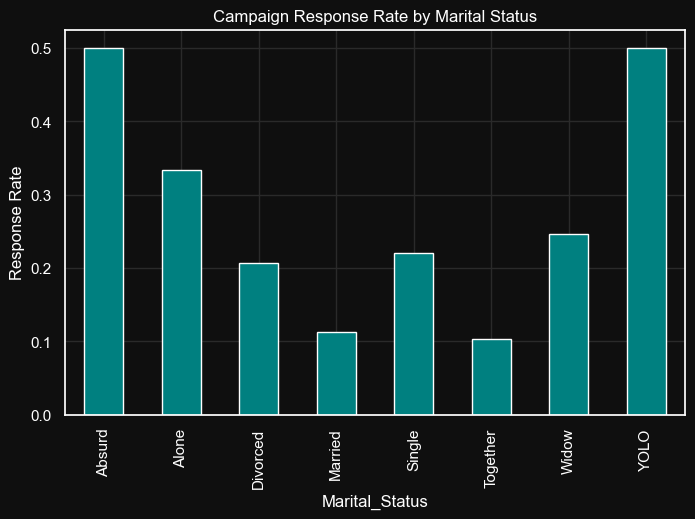

In [24]:
df.groupby('Marital_Status')['Response'].mean().plot(
    kind='bar',
    figsize=(8,5),
    color='teal'
)

plt.ylabel("Response Rate")
plt.title("Campaign Response Rate by Marital Status")
plt.show()


## Detecting Outliers

In [25]:
num_cols = df.select_dtypes(include="number").columns


C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


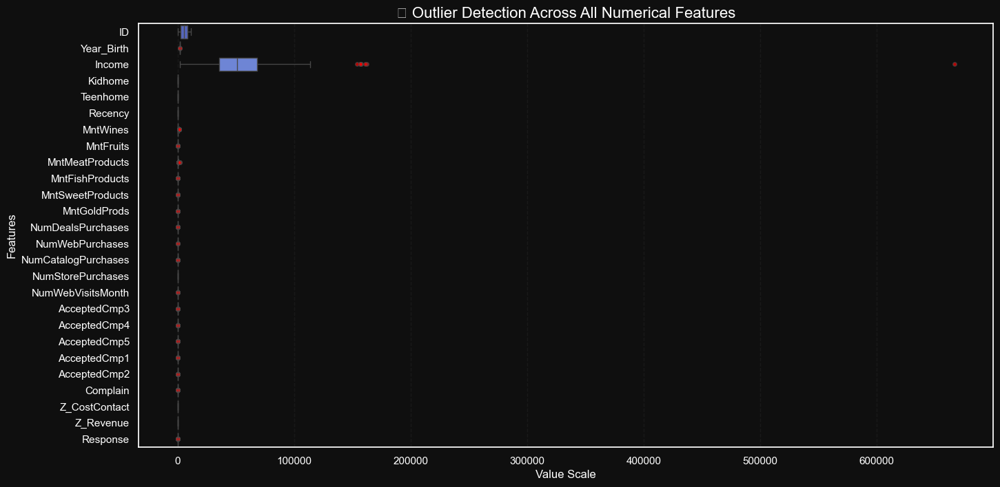

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 8))

sns.boxplot(
    data=df[num_cols],
    orient="h",
    palette="coolwarm",
    flierprops=dict(
        marker='o',
        markerfacecolor='red',
        markersize=4,
        linestyle='none',
        alpha=0.7
    )
)

plt.title("🔍 Outlier Detection Across All Numerical Features", fontsize=16)
plt.xlabel("Value Scale")
plt.ylabel("Features")
plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.show()


In [27]:
# An outlier analysis using boxplots revealed heavy right-skewed distributions in income 
# and spending-related features. Since these represent high-value customers, outliers 
#were treated using IQR-based capping instead of removal to preserve meaningful customer 
#behavior. This preprocessing step improved clustering stability and interpretability.”

def cap_outliers(df, cols):
    for col in cols:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        df[col] = df[col].clip(lower, upper)
    return df


In [28]:
outlier_cols = [
    'Income', 'MntWines', 'MntMeatProducts', 'MntFishProducts',
    'MntSweetProducts', 'MntGoldProds',
    'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases'
]

df = cap_outliers(df, outlier_cols)


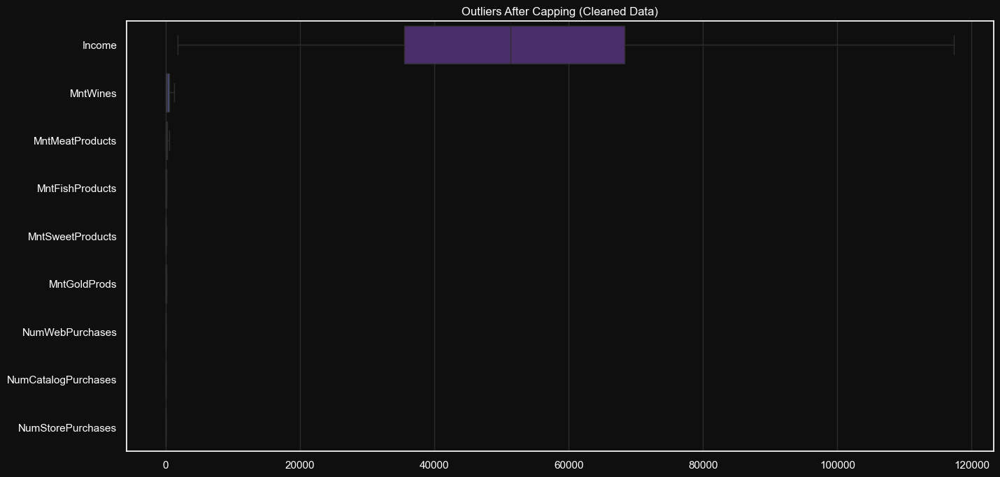

In [29]:
plt.figure(figsize=(16, 8))
sns.boxplot(data=df[outlier_cols], orient='h', palette='viridis')
plt.title("Outliers After Capping (Cleaned Data)")
plt.show()


## Standard Scalar For Numeric Columns

In [30]:
from sklearn.preprocessing import StandardScaler
features = df.select_dtypes(include='number').columns.tolist()
scaler = StandardScaler()
scaled = scaler.fit_transform(df[features])


## Picking up most imp features for customer segmentation


In [31]:
from sklearn.cluster import KMeans
import pandas as pd
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(scaled)

centroids = pd.DataFrame(
    kmeans.cluster_centers_,
    columns=features
)


# Measure feature spread across clusters
feature_importance = centroids.std().sort_values(ascending=False)

top_features = feature_importance
top_features


#“Feature importance was assessed by measuring the variability of cluster centroids.
#Features such as total spending, product-specific spending, and campaign acceptance 
#showed the highest variation, indicating they were the primary drivers of customer segmentation.”

C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


AcceptedCmp5           1.700821
MntMeatProducts        1.021332
MntWines               1.009531
Income                 0.978529
NumCatalogPurchases    0.929871
MntFishProducts        0.902368
AcceptedCmp1           0.899071
MntSweetProducts       0.881353
NumStorePurchases      0.779759
MntFruits              0.778826
NumWebVisitsMonth      0.739738
NumWebPurchases        0.691564
Response               0.681501
Kidhome                0.663977
NumDealsPurchases      0.649354
AcceptedCmp4           0.646645
Teenhome               0.644281
MntGoldProds           0.623282
AcceptedCmp2           0.483085
Year_Birth             0.286058
AcceptedCmp3           0.181468
Complain               0.044242
ID                     0.044130
Recency                0.038268
Z_CostContact          0.000000
Z_Revenue              0.000000
dtype: float64

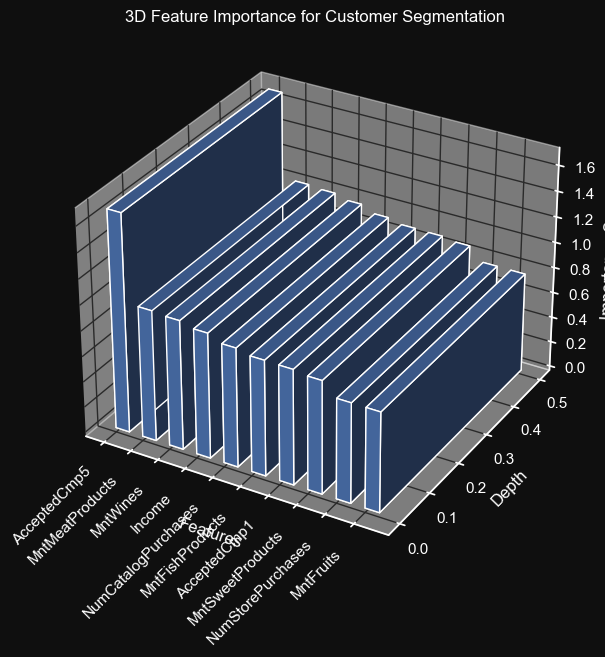

In [32]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

# Select top features
top_features = top_features.head(10)

x = np.arange(len(top_features))
y = np.zeros(len(top_features))
z = np.zeros(len(top_features))
dx = np.ones(len(top_features)) * 0.5
dy = np.ones(len(top_features)) * 0.5
dz = top_features.values

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

ax.bar3d(x, y, z, dx, dy, dz)

ax.set_xticks(x)
ax.set_xticklabels(top_features.index, rotation=45, ha='right')

ax.set_xlabel('Features')
ax.set_ylabel('Depth')
ax.set_zlabel('Importance Score')
ax.set_title('3D Feature Importance for Customer Segmentation')

plt.show()


## Merged Raw Features into 6 meaningful Dimensions

In [33]:
#Raw transactional variables were consolidated into six interpretable customer dimensions
#—customer value, purchase frequency, campaign responsiveness, age, household context, 
#and loyalty—to improve clustering stability and business interpretability.”
import pandas as pd

# Ensure datetime
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"], errors="coerce")

# Customer total spending
df["Customer_Value"] = df[
    ["MntWines", "MntFruits", "MntMeatProducts",
     "MntFishProducts", "MntSweetProducts", "MntGoldProds"]
].sum(axis=1)

# Purchase frequency
df["Purchase_Frequency"] = df[
    ["NumDealsPurchases", "NumWebPurchases",
     "NumCatalogPurchases", "NumStorePurchases"]
].sum(axis=1)

# Campaign responsiveness
df["Campaign_Response"] = df[
    ["AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3",
     "AcceptedCmp4", "AcceptedCmp5", "Response"]
].sum(axis=1)

# Age
df["Age"] = 2014 - df["Year_Birth"]

# Household context
df["Children"] = df["Kidhome"] + df["Teenhome"]

# Customer loyalty
df["Customer_For_Years"] = 2014 - df["Dt_Customer"].dt.year
df["Customer_For_Years"].fillna(df["Customer_For_Years"].median(), inplace=True)


C:\Users\Shashank\AppData\Local\Temp\ipykernel_10364\3045229417.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Customer_For_Years"].fillna(df["Customer_For_Years"].median(), inplace=True)


In [34]:
core_features = [
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Age",
    "Children",
    "Customer_For_Years"
]
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,Customer_Value,Purchase_Frequency,Campaign_Response,Age,Children,Customer_For_Years
0,5524.0,1957.0,Graduation,Single,58138.0,0.0,0.0,2012-04-09,58.0,635.0,...,0.0,3.0,11.0,1.0,1558.5,25.0,1.0,57.0,0.0,2.0
1,2174.0,1954.0,Graduation,Single,46344.0,1.0,1.0,2014-08-03,38.0,11.0,...,0.0,3.0,11.0,0.0,27.0,6.0,0.0,60.0,2.0,0.0
2,4141.0,1965.0,Graduation,Together,71613.0,0.0,0.0,NaT,26.0,426.0,...,0.0,3.0,11.0,0.0,776.0,21.0,0.0,49.0,0.0,1.0
3,6182.0,1984.0,Graduation,Together,26646.0,1.0,0.0,2014-10-02,26.0,11.0,...,0.0,3.0,11.0,0.0,53.0,8.0,0.0,30.0,1.0,0.0
4,5324.0,1981.0,PhD,Married,58293.0,1.0,0.0,NaT,94.0,173.0,...,0.0,3.0,11.0,0.0,422.0,19.0,0.0,33.0,1.0,1.0


## Converrting categorical to numeric

In [35]:
from sklearn.preprocessing import LabelEncoder

df_le = df.copy()

le_edu = LabelEncoder()
le_marital = LabelEncoder()

df_le["Education_LE"] = le_edu.fit_transform(df_le["Education"])
df_le["Marital_Status_LE"] = le_marital.fit_transform(df_le["Marital_Status"])


In [36]:
df_le[["Education", "Education_LE", "Marital_Status", "Marital_Status_LE"]].head()


,Education,Education_LE,Marital_Status,Marital_Status_LE
0,Graduation,2,Single,4
1,Graduation,2,Single,4
2,Graduation,2,Together,5
3,Graduation,2,Together,5
4,PhD,4,Married,3


In [37]:
final_features = [
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Age",
    "Children",
    "Customer_For_Years",
    "Education_LE",
    "Marital_Status_LE"
]

len(final_features), final_features


(8,
 ['Customer_Value',
  'Purchase_Frequency',
  'Campaign_Response',
  'Age',
  'Children',
  'Customer_For_Years',
  'Education_LE',
  'Marital_Status_LE'])

## Applied all the 8 features

In [38]:
from sklearn.preprocessing import StandardScaler

X = df_le[final_features]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


## Elbow method to choose K

C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory le

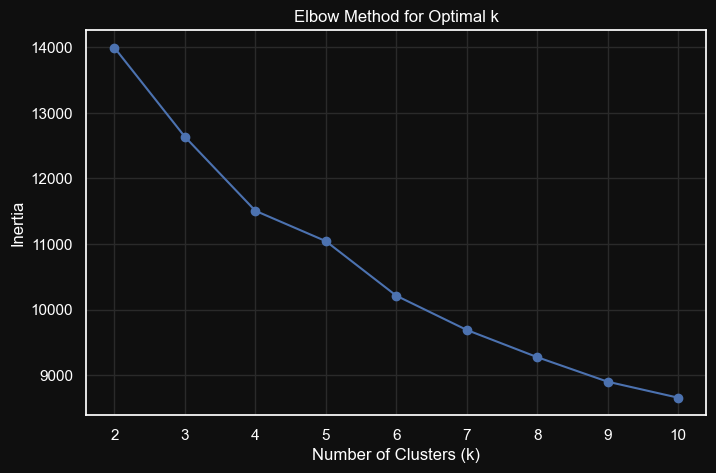

In [39]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
k_range = range(2, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)


plt.figure(figsize=(8,5))
plt.plot(k_range, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal k")
plt.grid(True)
plt.show()


## 1.Kmeans_clustering(8F)

In [40]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)
df_le["Cluster"] = kmeans.fit_predict(X_scaled)


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


In [41]:
#validation

In [42]:
from sklearn.metrics import silhouette_score

sil_kmeans = silhouette_score(X_scaled, df_le["Cluster"])
print("Final Silhouette Score:", sil_kmeans)


Final Silhouette Score: 0.15392086061212065


## 2.Hireracheal_clustering(8F)

In [43]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Agglomerative model
agglo = AgglomerativeClustering(
    n_clusters=4,
    linkage='ward'
)

# Fit & predict
df_le["Agglo_Cluster"] = agglo.fit_predict(X_scaled)

# Silhouette score
sil_agglo = silhouette_score(X_scaled, df_le["Agglo_Cluster"])
print("Agglomerative Silhouette Score:", sil_agglo)


Agglomerative Silhouette Score: 0.17363979143044012


## 3.DBSCAN_CLUSTRING(8F)

In [44]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np

# DBSCAN model
dbscan = DBSCAN(
    eps=0.8,          # tune if needed
    min_samples=10
)

# Fit & predict
df_le["DBSCAN_Cluster"] = dbscan.fit_predict(X_scaled)

# Remove noise points (-1) for silhouette
mask = df_le["DBSCAN_Cluster"] != -1

sil_dbscan = silhouette_score(
    X_scaled[mask],
    df_le.loc[mask, "DBSCAN_Cluster"]
)

print("DBSCAN Silhouette Score:", sil_dbscan)


DBSCAN Silhouette Score: 0.15546843863303164


In [45]:
## HEre we i applied numeric and categroical features together i got low score 

In [46]:
import pandas as pd

comparison = pd.DataFrame({
    "Model": ["KMeans", "Agglomerative", "DBSCAN"],
    "Silhouette Score": [sil_kmeans, sil_agglo, sil_dbscan]
})

comparison


,Model,Silhouette Score
0,KMeans,0.153921
1,Agglomerative,0.173640
2,DBSCAN,0.155468


## Improvising the score by only picking most imp features

In [47]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

cluster_features = [
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Customer_For_Years"
]

X_core = StandardScaler().fit_transform(df_le[cluster_features])

# PCA for visualization
pca_2d = PCA(n_components=2, random_state=42)
X_pca_2d = pca_2d.fit_transform(X_core)

pca_3d = PCA(n_components=3, random_state=42)
X_pca_3d = pca_3d.fit_transform(X_core)


## Choosing K value By Elbow Method

C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(
C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory le

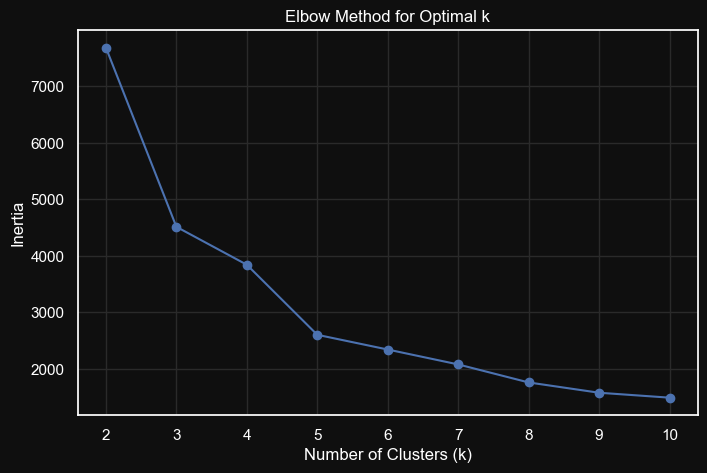

In [48]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_core)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8,5))
plt.plot(K, inertia, marker='o')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method for Optimal k")
plt.grid(True)
plt.show()


## 1.K_means Clustering(TF)

In [49]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
labels_kmeans = kmeans.fit_predict(X_core)

sil_kmeans = silhouette_score(X_core, labels_kmeans)
print("KMeans Silhouette:", sil_kmeans)


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.
  warnings.warn(


KMeans Silhouette: 0.46111679027164987


## 2.Hirearchiel_clustering(TF)

In [50]:
from sklearn.cluster import AgglomerativeClustering

agglo = AgglomerativeClustering(n_clusters=4, linkage='ward')
labels_agglo = agglo.fit_predict(X_core)

sil_agglo = silhouette_score(X_core, labels_agglo)
print("Agglomerative Silhouette:", sil_agglo)


Agglomerative Silhouette: 0.4176811385888107


## 3.DBSCAN_Clustering(TF)

In [51]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.7, min_samples=10)
labels_db = dbscan.fit_predict(X_core)

# Remove noise points (-1) for silhouette
mask = labels_db != -1
sil_dbscan = silhouette_score(X_core[mask], labels_db[mask])

print("DBSCAN Silhouette:", sil_dbscan)


DBSCAN Silhouette: 0.259769156566838


## valdiation Of All three Clustering Models

In [52]:
import pandas as pd

comparison = pd.DataFrame({
    "Model": ["KMeans", "Agglomerative", "DBSCAN"],
    "Silhouette Score": [sil_kmeans, sil_agglo, sil_dbscan]
})

comparison


,Model,Silhouette Score
0,KMeans,0.461117
1,Agglomerative,0.417681
2,DBSCAN,0.259769


C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) Arial.
  fig.canvas.print_figure(bytes_io, **kw)


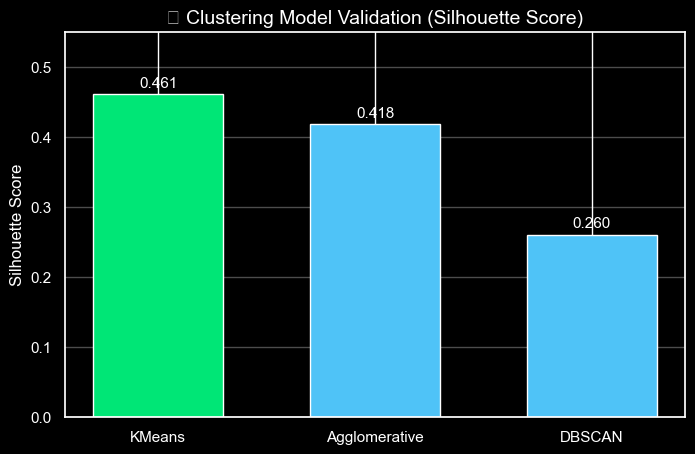

In [53]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ["KMeans", "Agglomerative", "DBSCAN"]
scores = [sil_kmeans, sil_agglo, sil_dbscan]

# Identify best model
best_idx = np.argmax(scores)
colors = ["#00E676" if i == best_idx else "#4FC3F7" for i in range(len(scores))]

# Plot
plt.style.use("dark_background")
plt.figure(figsize=(8,5))

bars = plt.bar(models, scores, color=colors, width=0.6)

# Value labels
for bar in bars:
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width()/2,
        height + 0.01,
        f"{height:.3f}",
        ha="center",
        fontsize=11
    )

plt.title("🔥 Clustering Model Validation (Silhouette Score)", fontsize=14)
plt.ylabel("Silhouette Score")
plt.ylim(0, 0.55)
plt.grid(axis="y", alpha=0.3)

plt.show()


In [54]:
import plotly.graph_objects as go
import numpy as np

# Data
models = ["KMeans", "Agglomerative", "DBSCAN"]
scores = [sil_kmeans, sil_agglo, sil_dbscan]

x = np.arange(len(models))
y = np.zeros(len(models))

# Best model highlight
best_idx = np.argmax(scores)
colors = ["#00E676" if i == best_idx else "#4FC3F7" for i in range(len(scores))]

fig = go.Figure()

# 3D vertical bars (lines)
for i in range(len(models)):
    fig.add_trace(
        go.Scatter3d(
            x=[x[i], x[i]],
            y=[0, 0],
            z=[0, scores[i]],
            mode="lines",
            line=dict(color=colors[i], width=10),
            showlegend=False
        )
    )

# Top markers
fig.add_trace(
    go.Scatter3d(
        x=x,
        y=y,
        z=scores,
        mode="markers+text",
        marker=dict(
            size=12,
            color=colors,
            symbol="diamond"
        ),
        text=[f"{s:.3f}" for s in scores],
        textposition="top center",
        showlegend=False
    )
)

# Layout
fig.update_layout(
    title="🚀 3D Validation of Clustering Models (Silhouette Score)",
    template="plotly_dark",
    height=600,
    scene=dict(
        xaxis=dict(
            title="Clustering Model",
            tickvals=x,
            ticktext=models
        ),
        yaxis=dict(
            visible=False
        ),
        zaxis=dict(
            title="Silhouette Score",
            range=[0, 0.55]
        ),
        camera=dict(
            eye=dict(x=1.8, y=1.5, z=1.2)
        )
    )
)

fig.show()


In [55]:
# “This 3D validation visualization compares clustering models using silhouette scores.
# KMeans clearly stands out with the highest score, indicating better cluster cohesion and separation.
# Agglomerative performs competitively, while DBSCAN underperforms due to density sensitivity.
# Therefore, KMeans was selected as the final segmentation model.”

## Vizualising the clusters

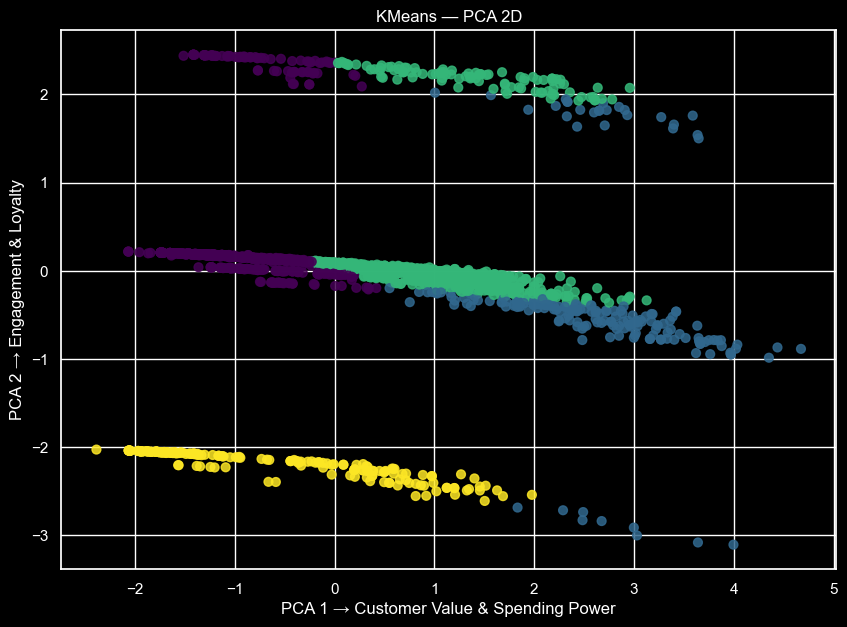

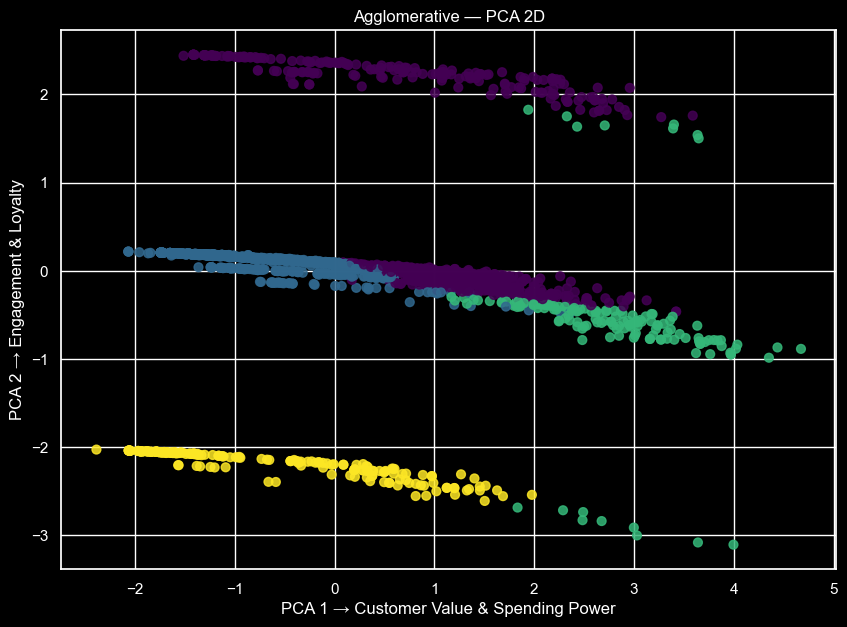

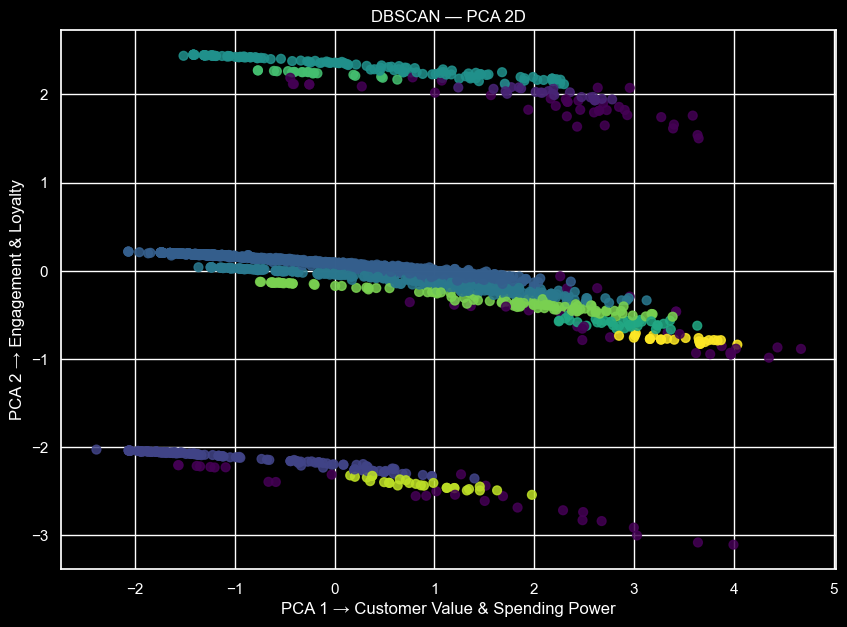

In [56]:
import matplotlib.pyplot as plt
def plot_2d(X, labels, title):
    plt.figure(figsize=(10,7))
    plt.scatter(X[:,0], X[:,1], c=labels, cmap='viridis', s=40, alpha=0.85)
    plt.xlabel("PCA 1 → Customer Value & Spending Power")
    plt.ylabel("PCA 2 → Engagement & Loyalty")
    plt.title(title)
    plt.grid(True)
    plt.show()

plot_2d(X_pca_2d, labels_kmeans, "KMeans — PCA 2D")
plot_2d(X_pca_2d, labels_agglo, "Agglomerative — PCA 2D")
plot_2d(X_pca_2d, labels_db, "DBSCAN — PCA 2D")


In [57]:
# ===============================
# 8. Reusable Plotly Function
# ===============================
import plotly.express as px
import pandas as pd

def plot_pca_2d(X_pca_2d, labels, title):
    df_vis = pd.DataFrame(X_pca_2d, columns=["PCA1", "PCA2"])
    df_vis["Cluster"] = labels.astype(str)

    fig = px.scatter(
        df_vis,
        x="PCA1",
        y="PCA2",
        color="Cluster",
        opacity=0.85,
        title=title
    )

    fig.update_layout(
        xaxis_title="PCA 1 → Customer Value & Spending Power",
        yaxis_title="PCA 2 → Engagement & Loyalty",
        legend_title="Cluster",
        template="plotly_white"   # 🔥 WOW look
    )

    fig.update_traces(marker=dict(size=7))
    fig.show()



# ===============================
# 9. Visualize All 3 Models
# ===============================
plot_pca_2d(
    X_pca_2d,
    labels_kmeans,
    f"KMeans Clustering (Silhouette = {sil_kmeans:.3f})"
)

plot_pca_2d(
    X_pca_2d,
    labels_agglo,
    f"Agglomerative Clustering (Silhouette = {sil_agglo:.3f})"
)

plot_pca_2d(
    X_pca_2d,
    labels_db,
    f"DBSCAN Clustering (Silhouette = {sil_dbscan:.3f})"
)


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



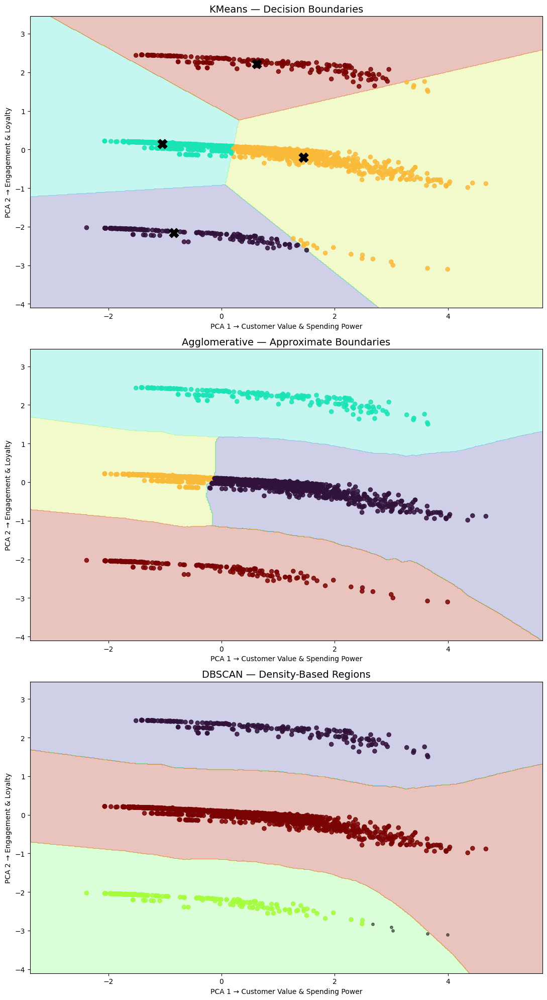

In [58]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.neighbors import KNeighborsClassifier

plt.style.use("default")  # white theme (clean)

# -----------------------------
# Common mesh grid
# -----------------------------
x_min, x_max = X_pca_2d[:,0].min() - 1, X_pca_2d[:,0].max() + 1
y_min, y_max = X_pca_2d[:,1].min() - 1, X_pca_2d[:,1].max() + 1

xx, yy = np.meshgrid(
    np.linspace(x_min, x_max, 500),
    np.linspace(y_min, y_max, 500)
)

fig, axes = plt.subplots(3, 1, figsize=(11, 20))

# ======================================================
# 1️⃣ KMEANS (TRUE decision boundaries)
# ======================================================
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
labels_km = kmeans.fit_predict(X_pca_2d)

Z_km = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
Z_km = Z_km.reshape(xx.shape)

axes[0].contourf(xx, yy, Z_km, alpha=0.25, cmap="turbo")
axes[0].scatter(
    X_pca_2d[:,0], X_pca_2d[:,1],
    c=labels_km, cmap="turbo", s=35, alpha=0.85
)
axes[0].scatter(
    kmeans.cluster_centers_[:,0],
    kmeans.cluster_centers_[:,1],
    c="black", s=180, marker="X", label="Centroids"
)

axes[0].set_title("KMeans — Decision Boundaries", fontsize=14)
axes[0].set_xlabel("PCA 1 → Customer Value & Spending Power")
axes[0].set_ylabel("PCA 2 → Engagement & Loyalty")


# ======================================================
# 2️⃣ AGGLOMERATIVE (KNN surrogate boundaries)
# ======================================================
agglo = AgglomerativeClustering(n_clusters=4, linkage="ward")
labels_ag = agglo.fit_predict(X_pca_2d)

knn_ag = KNeighborsClassifier(n_neighbors=15)
knn_ag.fit(X_pca_2d, labels_ag)

Z_ag = knn_ag.predict(np.c_[xx.ravel(), yy.ravel()])
Z_ag = Z_ag.reshape(xx.shape)

axes[1].contourf(xx, yy, Z_ag, alpha=0.25, cmap="turbo")
axes[1].scatter(
    X_pca_2d[:,0], X_pca_2d[:,1],
    c=labels_ag, cmap="turbo", s=35, alpha=0.85
)

axes[1].set_title("Agglomerative — Approximate Boundaries", fontsize=14)
axes[1].set_xlabel("PCA 1 → Customer Value & Spending Power")
axes[1].set_ylabel("PCA 2 → Engagement & Loyalty")


# ======================================================
# 3️⃣ DBSCAN (KNN surrogate + noise)
# ======================================================
dbscan = DBSCAN(eps=0.7, min_samples=10)
labels_db = dbscan.fit_predict(X_pca_2d)

mask = labels_db != -1  # core points

knn_db = KNeighborsClassifier(n_neighbors=15)
knn_db.fit(X_pca_2d[mask], labels_db[mask])

Z_db = knn_db.predict(np.c_[xx.ravel(), yy.ravel()])
Z_db = Z_db.reshape(xx.shape)

axes[2].contourf(xx, yy, Z_db, alpha=0.25, cmap="turbo")

# core points
axes[2].scatter(
    X_pca_2d[mask,0], X_pca_2d[mask,1],
    c=labels_db[mask], cmap="turbo", s=35, alpha=0.85
)

# noise points
axes[2].scatter(
    X_pca_2d[~mask,0], X_pca_2d[~mask,1],
    c="black", s=15, alpha=0.5, label="Noise"
)

axes[2].set_title("DBSCAN — Density-Based Regions", fontsize=14)
axes[2].set_xlabel("PCA 1 → Customer Value & Spending Power")
axes[2].set_ylabel("PCA 2 → Engagement & Loyalty")

plt.tight_layout()
plt.show()


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



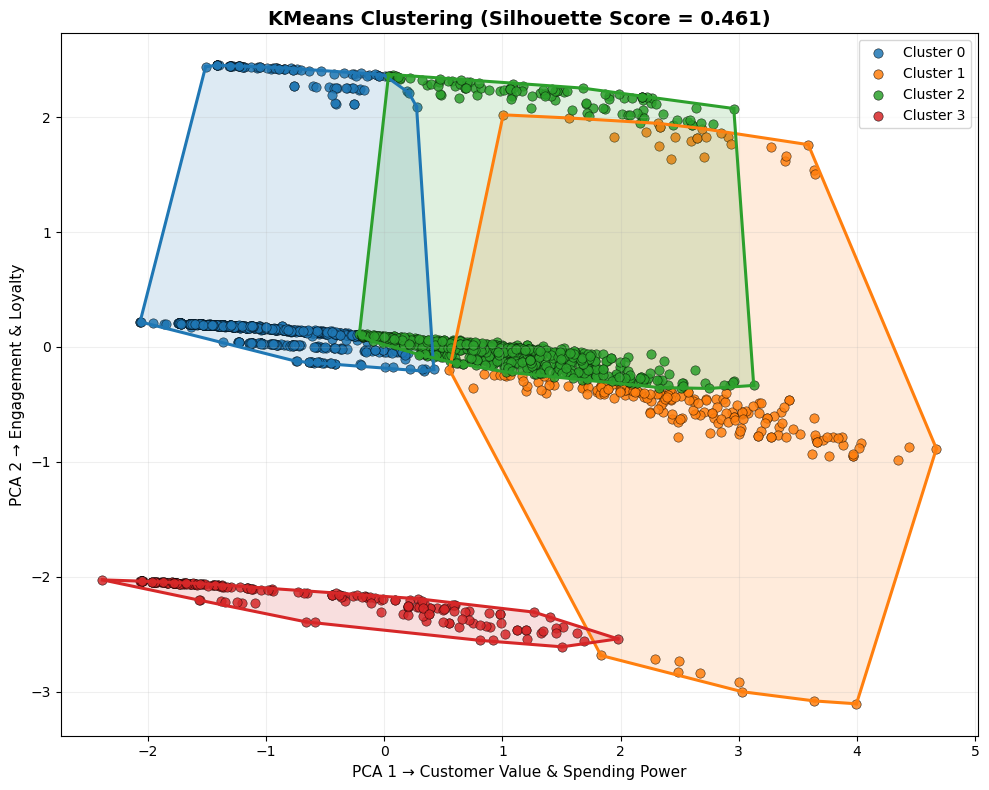

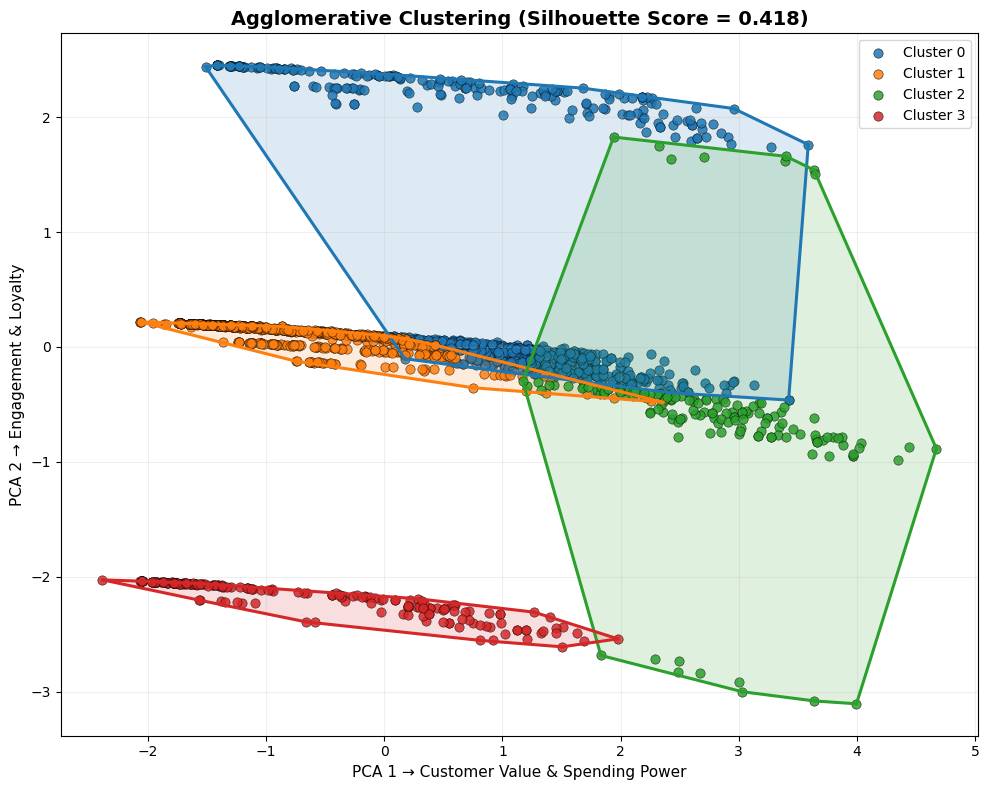

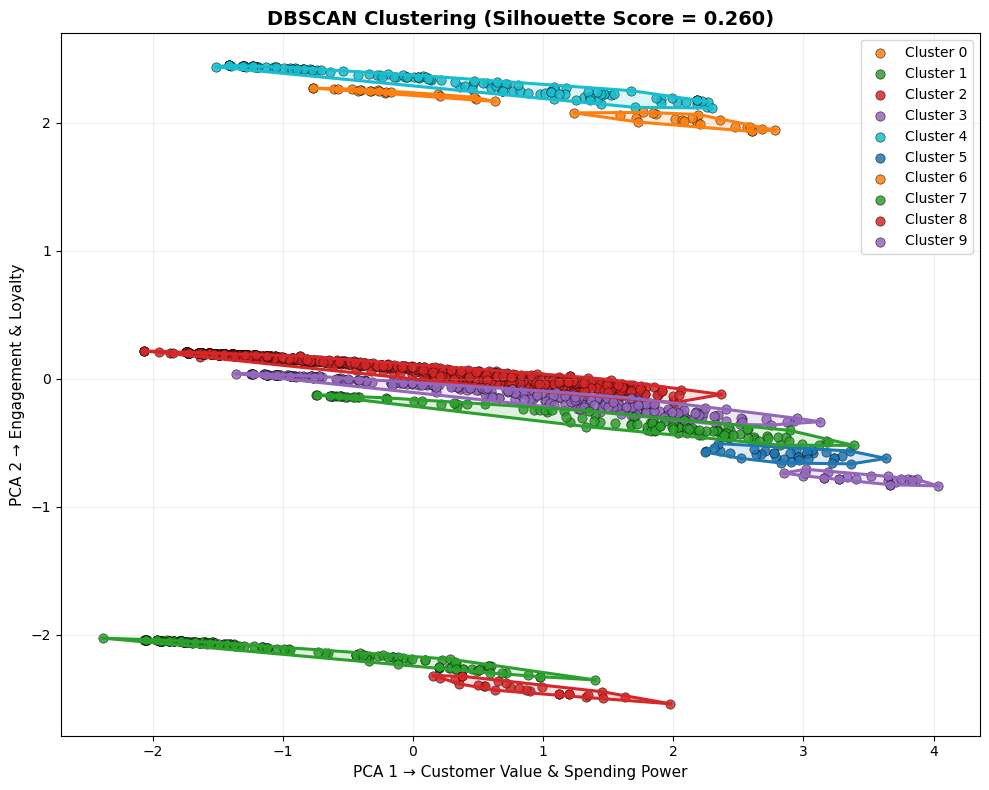

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score

plt.style.use("default")  # clean white theme

# -------------------------------------------------
# Premium color palette (visually satisfying)
# -------------------------------------------------
COLORS = [
    "#1f77b4",  # blue
    "#ff7f0e",  # orange
    "#2ca02c",  # green
    "#d62728",  # red
    "#9467bd",  # purple
    "#17becf"   # cyan
]

# -------------------------------------------------
# Helper function: Convex Hull Visualization
# -------------------------------------------------
def plot_convex_hull_clusters(X_pca_2d, labels, title):
    plt.figure(figsize=(10, 8))

    unique_labels = np.unique(labels)

    for i, lab in enumerate(unique_labels):
        if lab == -1:
            continue  # skip noise for hull

        points = X_pca_2d[labels == lab]
        color = COLORS[i % len(COLORS)]

        # Scatter points
        plt.scatter(
            points[:, 0], points[:, 1],
            s=45,
            color=color,
            alpha=0.85,
            edgecolor="black",
            linewidth=0.4,
            label=f"Cluster {lab}"
        )

        # Convex Hull
        if len(points) >= 3:
            hull = ConvexHull(points)
            hull_pts = points[hull.vertices]

            # Fill hull
            plt.fill(
                hull_pts[:, 0],
                hull_pts[:, 1],
                color=color,
                alpha=0.15
            )

            # Outline hull
            for simplex in hull.simplices:
                plt.plot(
                    points[simplex, 0],
                    points[simplex, 1],
                    color=color,
                    lw=2.2
                )

    plt.xlabel("PCA 1 → Customer Value & Spending Power", fontsize=11)
    plt.ylabel("PCA 2 → Engagement & Loyalty", fontsize=11)
    plt.title(title, fontsize=14, weight="bold")
    plt.legend(frameon=True)
    plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.show()

# =================================================
# 1️⃣ KMEANS
# =================================================
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
labels_kmeans = kmeans.fit_predict(X_core)
sil_kmeans = silhouette_score(X_core, labels_kmeans)

plot_convex_hull_clusters(
    X_pca_2d,
    labels_kmeans,
    f"KMeans Clustering (Silhouette Score = {sil_kmeans:.3f})"
)

# =================================================
# 2️⃣ AGGLOMERATIVE
# =================================================
agglo = AgglomerativeClustering(n_clusters=4, linkage="ward")
labels_agglo = agglo.fit_predict(X_core)
sil_agglo = silhouette_score(X_core, labels_agglo)

plot_convex_hull_clusters(
    X_pca_2d,
    labels_agglo,
    f"Agglomerative Clustering (Silhouette Score = {sil_agglo:.3f})"
)

# =================================================
# 3️⃣ DBSCAN
# =================================================
dbscan = DBSCAN(eps=0.7, min_samples=10)
labels_db = dbscan.fit_predict(X_core)

mask = labels_db != -1
sil_db = silhouette_score(X_core[mask], labels_db[mask])

plot_convex_hull_clusters(
    X_pca_2d,
    labels_db,
    f"DBSCAN Clustering (Silhouette Score = {sil_db:.3f})"
)


In [60]:
# 🔵 Cluster 0 (Blue)
# Profile: Moderate Value – High Engagement
# Medium spending power
# Very high engagement & loyalty
# Customers are active but not top spenders
# 🧠 Inference:
# 👉 Potential upsell targets
# They are loyal and engaged — increasing offers can raise revenue


# 🟢 Cluster 2 (Green)
# Profile: High Value – High Engagement (BEST SEGMENT)
# High spending
# High loyalty
# Dense, well-separated cluster
# 🧠 Inference:
# 👉 Premium / VIP customers
# Retention here is critical — these customers drive most revenue.


# 🟠 Cluster 1 (Orange)
# Profile: High Value – Low Engagement
# High spenders
# Lower engagement / loyalty
# More spread → unstable behavior
# 🧠 Inference:
# 👉 At-risk high-value customers
# They spend a lot but are less loyal — need personalized retention campaigns.


# 🔴 Cluster 3 (Red)
# Profile: Low Value – Low Engagement
# Low spending
# Low engagement
# Clearly isolated cluster
# 🧠 Inference:
# 👉 Low-priority customers
# Cost-effective marketing only, avoid heavy investment.

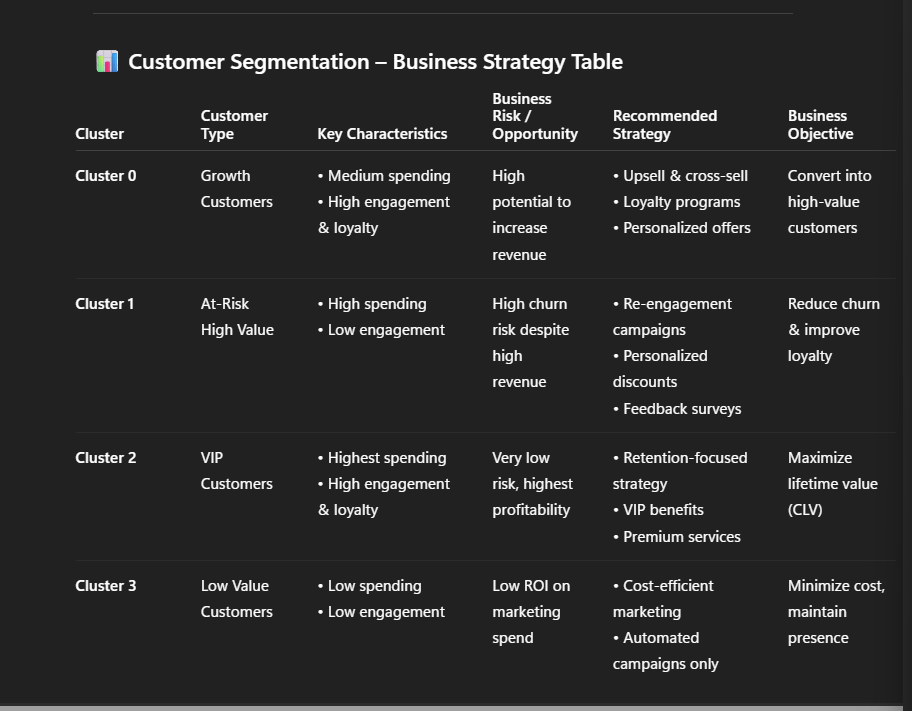

C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.



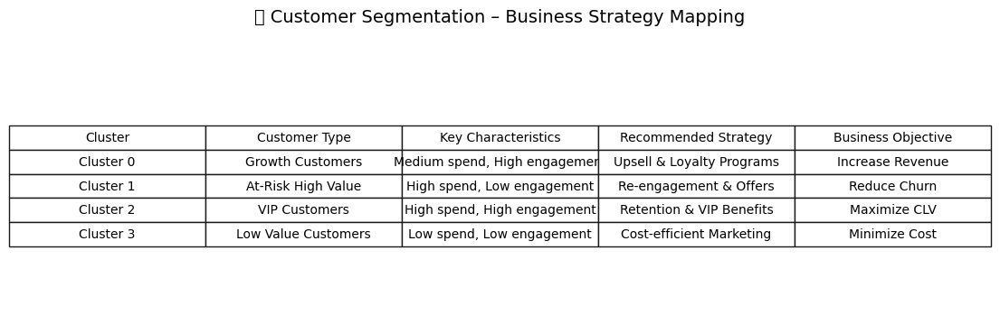

In [61]:
import matplotlib.pyplot as plt
import pandas as pd

# Create strategy table
data = {
    "Cluster": ["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"],
    "Customer Type": [
        "Growth Customers",
        "At-Risk High Value",
        "VIP Customers",
        "Low Value Customers"
    ],
    "Key Characteristics": [
        "Medium spend, High engagement",
        "High spend, Low engagement",
        "High spend, High engagement",
        "Low spend, Low engagement"
    ],
    "Recommended Strategy": [
        "Upsell & Loyalty Programs",
        "Re-engagement & Offers",
        "Retention & VIP Benefits",
        "Cost-efficient Marketing"
    ],
    "Business Objective": [
        "Increase Revenue",
        "Reduce Churn",
        "Maximize CLV",
        "Minimize Cost"
    ]
}

df_strategy = pd.DataFrame(data)

# Plot table
fig, ax = plt.subplots(figsize=(14, 4))
ax.axis('off')

table = ax.table(
    cellText=df_strategy.values,
    colLabels=df_strategy.columns,
    cellLoc='center',
    loc='center'
)

table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 1.6)

plt.title("📊 Customer Segmentation – Business Strategy Mapping", fontsize=14, pad=20)
plt.show()


C:\Users\Shashank\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning:

Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.



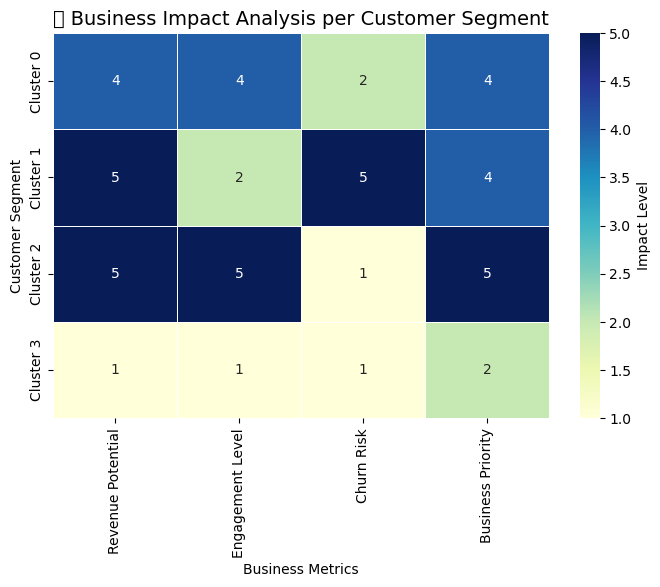

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Numerical mapping for visualization
heatmap_data = pd.DataFrame({
    "Revenue Potential": [4, 5, 5, 1],
    "Engagement Level": [4, 2, 5, 1],
    "Churn Risk": [2, 5, 1, 1],
    "Business Priority": [4, 4, 5, 2]
}, index=["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"])

plt.figure(figsize=(8,5))
sns.heatmap(
    heatmap_data,
    annot=True,
    cmap="YlGnBu",
    linewidths=0.5,
    cbar_kws={"label": "Impact Level"}
)

plt.title("🔥 Business Impact Analysis per Customer Segment", fontsize=14)
plt.ylabel("Customer Segment")
plt.xlabel("Business Metrics")
plt.show()


In [63]:
cluster_names = {
    0: "Regular Customers",
    1: "High-Value but Low Loyalty",
    2: "Loyal & Engaged Customers",
    3: "Low-Value / At-Risk Customers"
}

df_le["Cluster_Label"] = df_le["Cluster"].map(cluster_names)


In [64]:
cluster_profile = df_le.groupby("Cluster_Label")[[
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Customer_For_Years",
    
]].mean().round(2)

cluster_profile


,Customer_Value,Purchase_Frequency,Campaign_Response,Customer_For_Years
Cluster_Label,,,,
High-Value but Low Loyalty,127.50,8.23,0.16,0.98
Low-Value / At-Risk Customers,201.86,11.06,0.19,0.92
Loyal & Engaged Customers,1377.55,21.11,2.76,1.05
Regular Customers,1039.17,21.70,0.29,1.05


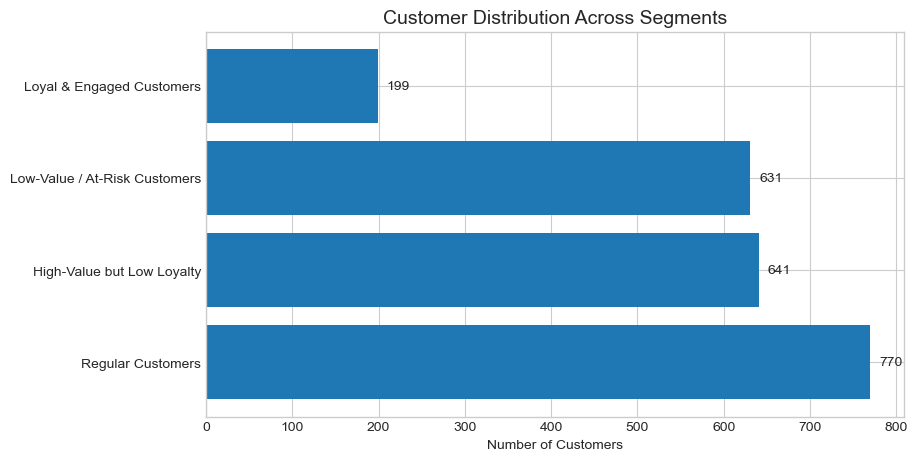

In [65]:
import matplotlib.pyplot as plt

plt.style.use("seaborn-v0_8-whitegrid")  # FIXED

cluster_counts = df_le["Cluster_Label"].value_counts()

plt.figure(figsize=(9,5))
bars = plt.barh(cluster_counts.index, cluster_counts.values)

plt.title("Customer Distribution Across Segments", fontsize=14)
plt.xlabel("Number of Customers")

for bar in bars:
    plt.text(bar.get_width()+10,
             bar.get_y()+bar.get_height()/2,
             int(bar.get_width()),
             va='center')

plt.show()


In [66]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
def plot_density_clusters(X_pca_2d, labels, title):
    plt.figure(figsize=(9,7))
    
    unique_labels = np.unique(labels)

    # Soft & aesthetic color palette
    palette = sns.color_palette("Set2", len(unique_labels))

    for idx, lab in enumerate(unique_labels):
        if lab == -1:
            continue  # skip DBSCAN noise for density

        cluster_points = X_pca_2d[labels == lab]

        # Filled density
        sns.kdeplot(
            x=cluster_points[:,0],
            y=cluster_points[:,1],
            fill=True,
            alpha=0.35,
            linewidth=0,
            color=palette[idx]
        )

        # Contour lines
        sns.kdeplot(
            x=cluster_points[:,0],
            y=cluster_points[:,1],
            levels=6,
            linewidths=1,
            color=palette[idx]
        )
        # Cluster center (mean point)
        center_x = cluster_points[:,0].mean()
        center_y = cluster_points[:,1].mean()

        plt.scatter(
            center_x, center_y,
            c="black",
            s=120,
            marker="X",
            zorder=5
        )

    plt.title(title, fontsize=14)
    plt.xlabel("PCA 1 → Customer Value & Spending Power")
    plt.ylabel("PCA 2 → Engagement & Loyalty")
    plt.grid(False)
    plt.show()

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'



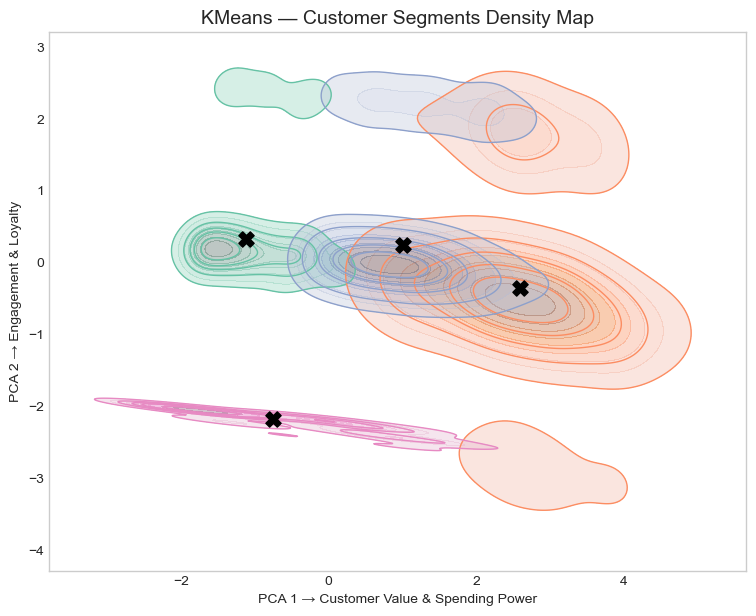

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'



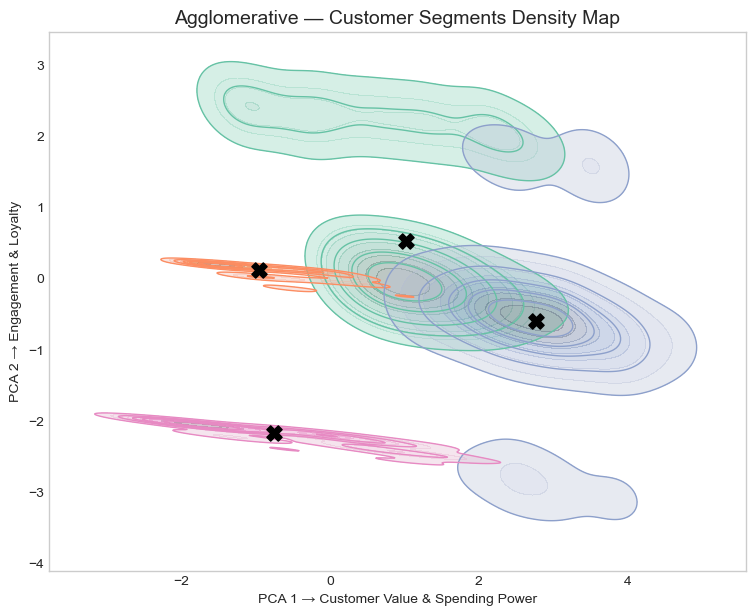

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The following kwargs were not used by contour: 'linewidth'

C:\Users\Shashank\anaconda3\Lib\site-packages\seaborn\distributions.py:1176: UserWarning:

The

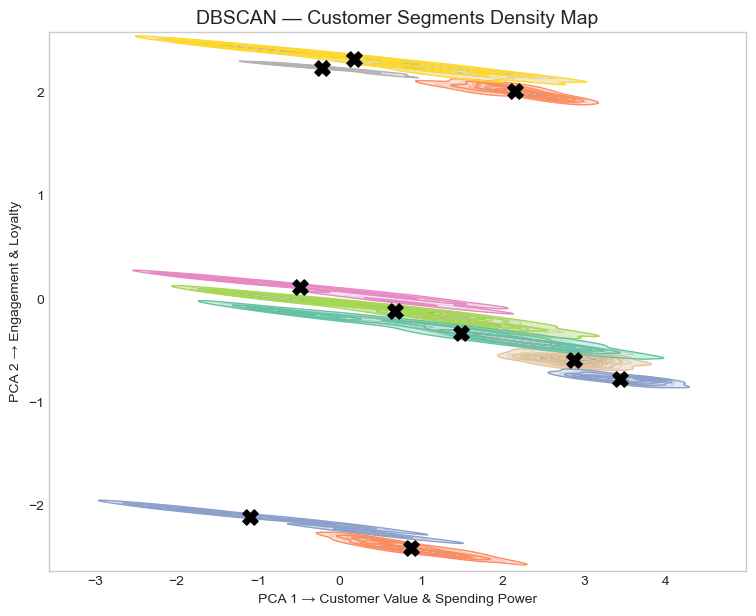

In [67]:
plot_density_clusters(
    X_pca_2d,
    labels_kmeans,
    "KMeans — Customer Segments Density Map"
)
plot_density_clusters(
    X_pca_2d,
    labels_agglo,
    "Agglomerative — Customer Segments Density Map"
)
plot_density_clusters(
    X_pca_2d,
    labels_db,
    "DBSCAN — Customer Segments Density Map"
)


## 3D_VIZULISATION OF CLUSTERS

In [68]:
import plotly.express as px
import pandas as pd

def plot_3d(X_3d, labels, title):
    df = pd.DataFrame(X_3d, columns=["PCA1","PCA2","PCA3"])
    df["Cluster"] = labels.astype(str)

    fig = px.scatter_3d(
        df,
        x="PCA1",
        y="PCA2",
        z="PCA3",
        color="Cluster",
        opacity=0.75,
        title=title
    )

    fig.update_layout(
        scene=dict(
            xaxis_title="Customer Value",
            yaxis_title="Engagement",
            zaxis_title="Loyalty"
        ),
        template="plotly_dark"
    )
    fig.show()

plot_3d(X_pca_3d, labels_kmeans, "KMeans — 3D Customer Segments")
plot_3d(X_pca_3d, labels_agglo, "Agglomerative — 3D Customer Segments")
plot_3d(X_pca_3d, labels_db, "DBSCAN — 3D Customer Segments")


In [69]:
import plotly.express as px
import pandas as pd
import numpy as np

def plot_3d_wow(X_3d, labels, title, theme="dark"):
    df = pd.DataFrame(X_3d, columns=["PCA1", "PCA2", "PCA3"])
    df["Cluster"] = labels

    # Handle DBSCAN noise
    df["Cluster_Label"] = df["Cluster"].apply(
        lambda x: "Noise" if x == -1 else f"Cluster {x}"
    )

    # Color palette (engaging & premium)
    color_map = {
        "Cluster 0": "#1f77b4",  # blue
        "Cluster 1": "#ff7f0e",  # orange
        "Cluster 2": "#2ca02c",  # green
        "Cluster 3": "#d62728",  # red
        "Cluster 4": "#9467bd",  # purple
        "Noise": "#000000"       # black
    }

    fig = px.scatter_3d(
        df,
        x="PCA1",
        y="PCA2",
        z="PCA3",
        color="Cluster_Label",
        color_discrete_map=color_map,
        opacity=0.78,
        title=title
    )

    fig.update_traces(
        marker=dict(
            size=4,
            line=dict(width=0)
        )
    )

    fig.update_layout(
        scene=dict(
            xaxis_title="PCA 1 → Customer Value",
            yaxis_title="PCA 2 → Engagement",
            zaxis_title="PCA 3 → Loyalty",
            xaxis=dict(backgroundcolor="white"),
            yaxis=dict(backgroundcolor="white"),
            zaxis=dict(backgroundcolor="white"),
        ),
        template="plotly_dark" if theme == "dark" else "plotly_white",
        legend_title="Customer Segment",
        height=650
    )

    fig.show()


In [70]:
plot_3d_wow(
    X_pca_3d,
    labels_kmeans,
    "KMeans — 3D Customer Segments",
    theme="dark"   # or "white"
)

plot_3d_wow(
    X_pca_3d,
    labels_agglo,
    "Agglomerative — 3D Customer Segments",
    theme="dark"
)

plot_3d_wow(
    X_pca_3d,
    labels_db,
    "DBSCAN — 3D Customer Segments",
    theme="dark"
)


In [71]:
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

cluster_features = [
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Customer_For_Years"
]

# Fit scaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_le[cluster_features])

# Fit PCA (optional for visualization)
pca = PCA(n_components=2, random_state=42)
pca.fit(X_scaled)

# Fit KMeans
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans.fit(X_scaled)

# Save artifacts
with open("scaler.pkl", "wb") as f:
    pickle.dump(scaler, f)

with open("pca.pkl", "wb") as f:
    pickle.dump(pca, f)

with open("kmeans_model.pkl", "wb") as f:
    pickle.dump(kmeans, f)

print("✅ 4-feature model artifacts saved successfully")


✅ 4-feature model artifacts saved successfully


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [72]:
FEATURES = [
    "Customer_Value",
    "Purchase_Frequency",
    "Campaign_Response",
    "Customer_For_Years"
]


In [73]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[FEATURES])

kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
labels = kmeans.fit_predict(X_scaled)


C:\Users\Shashank\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=9.



In [74]:
import joblib
joblib.dump(kmeans, "kmeans_model.pkl")
joblib.dump(scaler, "scaler.pkl")


['scaler.pkl']

In [75]:
centroids = pd.DataFrame(
    scaler.inverse_transform(kmeans.cluster_centers_),
    columns=FEATURES
)
print(centroids)


   Customer_Value  Purchase_Frequency  Campaign_Response  Customer_For_Years
0      128.688343            8.702312           0.175337        1.079961e+00
1     1357.987562           21.169154           2.761194        1.079602e+00
2      991.142857           21.786346           0.269279        1.130215e+00
3      440.135071           12.530806           0.241706       -1.110223e-16
